# Assignment 4: Computational Code and Output

First we install the necessary libraries to read, clean, wrangle, and visualize our data:

In [1]:
options(repr.plot.width = 30, repr.plot.height = 20)
library(tidyverse)
library(tidymodels)
library(cowplot)
library(GGally)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.3     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.1.1 ──

✔ broom        1.0.5     ✔ rsample      1.2.0
✔ dials        1.2.0     ✔ tune         1.1.2
✔ infer        1.0.5     ✔ workflows    1.1.3
✔ modeldata    1.2.0     ✔ workflowsets 1.0.1
✔ parsnip      1.1.1     ✔ yardstick    1.2.0
✔ recipes      1.0.8     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filt

The dataset chosen is called "Heart failure clinical records" and can be found at https://archive.ics.uci.edu/dataset/519/heart+failure+clinical+records, with more detailed information about the dataset being reported in a paper found at https://doi.org/10.1186/s12911-020-1023-5. It has been uploaded to a GitHub repository, https://raw.githubusercontent.com/megannma/stat-301-group-project/main/heart_failure_clinical_records_dataset.csv, so we can read the data from the web into R. We also filter out any NA values.

In [2]:
heart_failure_data <- read_csv("https://raw.githubusercontent.com/megannma/stat-301-group-project/main/heart_failure_clinical_records_dataset.csv") %>%
    drop_na()
head(heart_failure_data)

Rows: 299 Columns: 13
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (13): age, anaemia, creatinine_phosphokinase, diabetes, ejection_fractio...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
75,0,582,0,20,1,265000,1.9,130,1,0,4,1
55,0,7861,0,38,0,263358,1.1,136,1,0,6,1
65,0,146,0,20,0,162000,1.3,129,1,1,7,1
50,1,111,0,20,0,210000,1.9,137,1,0,7,1
65,1,160,1,20,0,327000,2.7,116,0,0,8,1
90,1,47,0,40,1,204000,2.1,132,1,1,8,1


This dataset includes the medical records collected during the follow-up of 299 patients (the 299 observations) who had heart failure and consists of 13 variables, which correspond to the 13 observed clinical features of each patient. Hence, there are no missing values. The data was collected at the Faisalabad Institute of Cardiology and at the Allied Hospital in Faisalabad (Punjab, Pakistan), during April – December 2015. The patients consist of 105 women and 194 men, with ages ranging from 40 and 95 years old. Each patient had heart failure. The 13 variables, or clinical features, in the dataset are all integers and are described as follows:

- age: age of the patient (years)
- anaemia: decrease of red blood cells or hemoglobin (boolean)
- creatinine phosphokinase (CPK): level of the CPK enzyme in the blood (mcg/L)
- diabetes: if the patient has diabetes (boolean)
- ejection fraction: percentage of blood leaving the heart at each contraction (percentage)
- high blood pressure: if the patient has hypertension (boolean)
- platelets: platelets in the blood (kiloplatelets/mL)
- sex: woman or man (binary)
- serum creatinine: level of serum creatinine in the blood (mg/dL)
- serum sodium: level of serum sodium in the blood (mEq/L)
- smoking: if the patient smokes or not (boolean)
- time: follow-up period (days)
- [target] death event: if the patient died during the follow-up period (boolean)

My question is: Which clinical features of a patient can be used to accurately predict if the patient dies during the follow-up period? This question is focused on inference because I intend to analyze how the variables are related to each other. Although the dataset contains 12 other variables that can be used to predict the response variable (death event), not all of them may be useful for making a prediction. For instance, there could be multicollinearity in the dataset where some variables have a large variance inflation factor or high pairwise correlation coefficients. Hence, the data will help me address the question of interest because I can use the observed clinical features to calculate pairwise correlation coefficients, variance inflation factors, and other measures to assess how well a regression model fits the data. From there, I can select only the variables that are suitable for a regression model.

Since I intend to analyze how the variables are related, my proposed visualization is a pair plot that shows the relationship between each pair of variables.

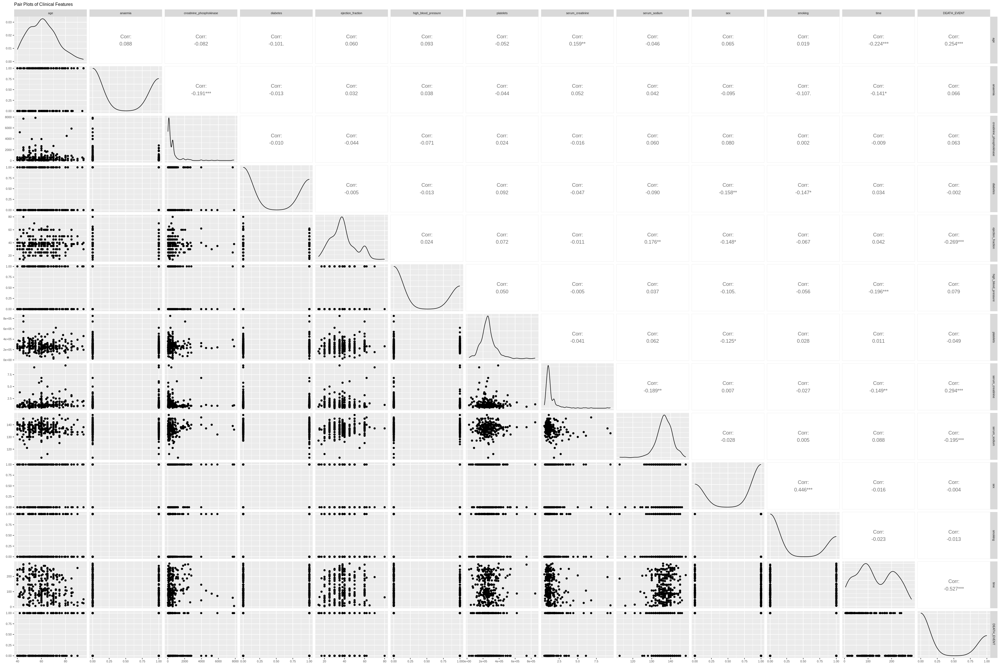

In [3]:
heart_failure_pairplots <- heart_failure_data %>%
    ggpairs() +
    theme(text = element_text(size = 8)) +
    ggtitle("Pair Plots of Clinical Features")
heart_failure_pairplots

I consider this plot relevant to address my question and to explore the data because it allows me to visualize how each of the variables are related to each other. For example, the plots for the continuous variables show the magnitude of the linear relationship between them and also provide the correlation coefficient. This allows me to explore multicollinearity by seeing if any explanatory variables are highly correlated with each other, which in turn gives me an idea of which clinical features may be suitable to include in a linear regression model. The correlation coefficients are not needed for the categorical variables, but the plots of categorical variables allow me to gain an understanding of how the distributions compare for each level.

However, the above plot draws attention to some potential problems that may arise in future assignments. I intended to include categorical variables as explanatory variables, but it may be difficult to determine which categorical variables are suitable for a linear regression model using the methods we have learned in class (e.g. computing adjusted $R^2$ or using model selection algorithms). In addition, since `DEATH_EVENT` is also categorical, it may be difficult to perform linear regression with that as a response variable. As a result, I will consider limiting my analysis to mainly continuous variables for future assignments.

The method I propose to address my question of interest is using logistic regression with explanatory variables selected by Lasso to select the clinical features that can be used to predict whether a patient dies during the follow-up period.

This method is appropriate for the following reasons:
- Since the response variable `DEATH_EVENT` is a binary variable, it is appropriate to create a logistic regression model because logistic regression is often used to model a binary outcome.
- It is also appropriate to use Lasso to select the explanatory variables used for prediction because Lasso can be used to select and train a model, as Lasso shrinks the coefficients to 0.

To apply logistic regression, we make the following assumptions:
- The response variable is a binary response variable. We can verify this since a patient either dies during the follow-up period or does not die during the follow-up period.
- The observations are independent of each other.
- The log of the odds ratio is a linear function of the explanatory variables.

There are also several potential limitations and weaknesses to consider:
- We are using the same sample, the dataset, to select the explanatory variables we will use and fit the logistic regression model. We can solve this problem by splitting the dataset into two subsets; one subset to select variables using Lasso, and another subset to fit the model to perform inference.
- Lasso's estimators are biased, so they are not centred at the value of the true parameter. We can solve this problem by re-fitting the model, i.e. using the variables selected by Lasso but re-estimating their coefficients using least squares.
- Several of the clinical features used for prediction such as `anaemia`, `diabetes`, and `high_blood_pressure` are binary variables. In the course so far we have only used Lasso with continuous explanatory variables, so it may be difficult or out of the scope of the course to use Lasso with binary variables. Hence, for simplicity I may only consider the continuous clinical features such as `creatinine_phosphokinase`, `ejection_fraction`, and `platelets` to create the logistic regression model.

Therefore, my plan is to use Lasso to select variables for the model, and to use logistic regression in order to fit a model a binary response variable.

## Implementation of a proposed model

For this assignment, I am choosing to implement the logistic regression method I proposed in the previous assignment. I will fit a logistic regression model with `DEATH_EVENT` as the response variable and all of the other clinical features in the dataset as the explanatory variables.

In [6]:
heart_failure_log_model <-
    glm(
        formula = DEATH_EVENT ~ .,
        data = heart_failure_data,
        family = binomial)

tidy(heart_failure_log_model, exponentiate = TRUE) %>%
    mutate_if(is.numeric, round, 3)

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),26500.769,5.657,1.801,0.072
age,1.049,0.016,3.001,0.003
anaemia,0.993,0.360,-0.021,0.983
creatinine_phosphokinase,1.000,0.000,1.249,0.212
diabetes,1.156,0.351,0.413,0.679
ejection_fraction,0.926,0.016,-4.695,0.000
high_blood_pressure,0.902,0.359,-0.286,0.775
platelets,1.000,0.000,-0.635,0.525
serum_creatinine,1.947,0.181,3.670,0.000


The results are reported in the table above, where we can observe the estimate, standard error, and p-value for each variable.

From our results, we see that at a significance level of 0.05, only `age`, `ejection_fraction`, `serum_creatinine`, and `time` are statistically associated with `DEATH_EVENT`. It is expected that not all of the clinical features are useful in predicting if a patient dies during the follow-up period or not, but it is somewhat unexpected that only 3/12 clinical features have significant p-values. However, this could be a result of the dataset being quite small and only consisting of 299 observations. The results address the question of interest because they show us the relationship between `DEATH_EVENT` and the other 12 clinical features, and so we gain a sense of which clinical features are most appropriate to include in a logistic regression model.